In [1]:
import numpy as np
import pandas as pd
import seaborn as sbn
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

In [2]:
tweet_topic_df_12 = pd.read_csv('12_topic_LDA_w_tweets.csv', index_col = False)

tweet_topic_columns = ['index'] + [x for x in range(12)] + ['tweet']
tweet_topic_df_12.columns = tweet_topic_columns
tweet_topic_df_12.set_index('index', drop = True, inplace = True)
tweet_topic_df_12

,0,1,2,3,4,5,6,7,8,9,10,11,tweet
index,,,,,,,,,,,,,
0,0.091024,0.000000,0.000000,0.862694,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Desperate for a break from the headlines and t...
1,0.010422,0.010422,0.010423,0.010422,0.010423,0.154492,0.138908,0.010422,0.143832,0.479391,0.010422,0.010422,"@shortround131 @mmpadellan No your not crazy, ..."
2,0.088772,0.000000,0.000000,0.000000,0.664545,0.000000,0.000000,0.000000,0.189329,0.000000,0.000000,0.000000,@DmodosCutter @vintagecpk @Laboursupportuk I’m...
3,0.000000,0.000000,0.000000,0.445626,0.240940,0.000000,0.000000,0.000000,0.269308,0.000000,0.000000,0.000000,"Businesses providing essential groceries, medi..."
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.124220,0.510464,0.281795,0.000000,0.000000,0.000000,"Join us tomorrow for a panel discussion on ""Pr..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
27995,0.000000,0.140270,0.155318,0.000000,0.000000,0.000000,0.657543,0.000000,0.000000,0.000000,0.000000,0.000000,@UGifter we're gonna get our covid tests sched...
27996,0.013886,0.013886,0.013886,0.013886,0.013886,0.013886,0.498982,0.013886,0.013886,0.013887,0.013886,0.362158,More people getting sick at another party for ...
27997,0.000000,0.092198,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.274826,0.347564,0.080404,0.163353,"@AndreaHorwath Sure, all the hearts are aching..."


In [3]:
tweet_topic_df_12['topic'] = tweet_topic_df_12[[x for x in range(12)]].idxmax(axis = 1)
tweet_topic_df_12

,0,1,2,3,4,5,6,7,8,9,10,11,tweet,topic
index,,,,,,,,,,,,,,
0,0.091024,0.000000,0.000000,0.862694,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,Desperate for a break from the headlines and t...,3
1,0.010422,0.010422,0.010423,0.010422,0.010423,0.154492,0.138908,0.010422,0.143832,0.479391,0.010422,0.010422,"@shortround131 @mmpadellan No your not crazy, ...",9
2,0.088772,0.000000,0.000000,0.000000,0.664545,0.000000,0.000000,0.000000,0.189329,0.000000,0.000000,0.000000,@DmodosCutter @vintagecpk @Laboursupportuk I’m...,4
3,0.000000,0.000000,0.000000,0.445626,0.240940,0.000000,0.000000,0.000000,0.269308,0.000000,0.000000,0.000000,"Businesses providing essential groceries, medi...",3
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.124220,0.510464,0.281795,0.000000,0.000000,0.000000,"Join us tomorrow for a panel discussion on ""Pr...",7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27995,0.000000,0.140270,0.155318,0.000000,0.000000,0.000000,0.657543,0.000000,0.000000,0.000000,0.000000,0.000000,@UGifter we're gonna get our covid tests sched...,6
27996,0.013886,0.013886,0.013886,0.013886,0.013886,0.013886,0.498982,0.013886,0.013886,0.013887,0.013886,0.362158,More people getting sick at another party for ...,6
27997,0.000000,0.092198,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.274826,0.347564,0.080404,0.163353,"@AndreaHorwath Sure, all the hearts are aching...",9


In [4]:
pca = PCA(n_components = 2)
projected_12 = pca.fit_transform(tweet_topic_df_12[[x for x in range(12)]])

In [5]:
pca.explained_variance_

array([0.04876672, 0.03019892])

In [7]:
final_projection_12 = pd.DataFrame(data = projected_12, columns = ['principal component 1', 'principal component 2'])
final_projection_12 = final_projection_12.join(tweet_topic_df_12[['topic', 'tweet']])

In [8]:
final_projection_12

,principal component 1,principal component 2,topic,tweet
0,-0.162208,-0.148904,3,Desperate for a break from the headlines and t...
1,0.348826,0.110266,9,"@shortround131 @mmpadellan No your not crazy, ..."
2,-0.142093,-0.050430,4,@DmodosCutter @vintagecpk @Laboursupportuk I’m...
3,-0.144274,-0.098607,3,"Businesses providing essential groceries, medi..."
4,-0.159500,-0.170208,7,"Join us tomorrow for a panel discussion on ""Pr..."
...,...,...,...,...
27995,-0.187858,0.535616,6,@UGifter we're gonna get our covid tests sched...
27996,-0.163247,0.380914,6,More people getting sick at another party for ...
27997,0.234073,-0.009784,9,"@AndreaHorwath Sure, all the hearts are aching..."
27998,-0.152958,0.263789,6,"@donwinslow Oh that’s just @ChanelRion, the sa..."


Text(0, 0.5, 'component 2')

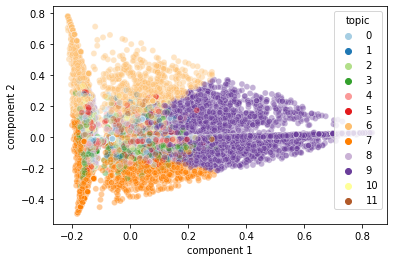

In [10]:
sbn.scatterplot(data = final_projection_12, x = 'principal component 1', y = 'principal component 2', 
               hue = 'topic', palette = 'Paired', alpha = 0.4)
plt.xlabel('component 1')
plt.ylabel('component 2')

In [11]:
import plotly.express as px

In [13]:
fig = px.scatter(final_projection_12, x = 'principal component 1', y = 'principal component 2', 
                 color = 'topic', hover_data = ['tweet'])
fig.show('notebook')